# EditShield — Colab Reproduction Notebook

**Paper:** *EditShield: Protecting Unauthorized Image Editing by Instruction-guided Diffusion Models* (Chen et al., 2024)

**What this notebook does:**
1. Adds imperceptible adversarial noise to images via VAE-latent-space poisoning
2. Verifies the protection: InstructPix2Pix fails to edit the protected images
3. Measures protection quality with CLIP image similarity and direction similarity

**Runtime requirement:** GPU (T4 minimum, A100 recommended for full dataset)

**Before running:** `Runtime → Change runtime type → T4 GPU`

---
## 0. GPU Check & Google Drive Mount
Models are saved to Drive so they survive session resets.

In [1]:
import torch

assert torch.cuda.is_available(), "No GPU found — change runtime to GPU first."
print(f"GPU   : {torch.cuda.get_device_name(0)}")
print(f"CUDA  : {torch.version.cuda}")
print(f"VRAM  : {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB")
print(f"Torch : {torch.__version__}")

GPU   : NVIDIA A100-SXM4-40GB
CUDA  : 12.8
VRAM  : 42.4 GB
Torch : 2.11.0+cu128


In [2]:
from google.colab import drive
drive.mount('/content/drive')

import os

# ── All persistent data (models, outputs) lives here ─────────────────────────
DRIVE_ROOT = '/content/drive/MyDrive/EditShield'
MODEL_DIR  = f'{DRIVE_ROOT}/models'          # HuggingFace cache
CLIP_DIR   = f'{DRIVE_ROOT}/clip'            # CLIP ViT-L/14 weights
DATA_DIR   = f'{DRIVE_ROOT}/train_data'      # input images + prompt.json
OUT_DIR    = f'{DRIVE_ROOT}/outputs'         # Ori / Adv / Gen / AdvGen / EXCEL

for d in [DRIVE_ROOT, MODEL_DIR, CLIP_DIR, DATA_DIR, OUT_DIR]:
    os.makedirs(d, exist_ok=True)

print("Drive mounted. Persistent root:", DRIVE_ROOT)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Drive mounted. Persistent root: /content/drive/MyDrive/EditShield


---
## 1. Install Dependencies
Run once. Skip on subsequent sessions if Drive cache is warm.

In [3]:
%%bash
# diffusers==0.25 used `cached_download` which huggingface_hub>=0.23 removed.
# Use diffusers>=0.30 which dropped that call entirely.
pip install -q \
  "diffusers>=0.30.0" \
  "transformers>=4.40.0" \
  "accelerate>=0.30.0" \
  "huggingface_hub>=0.23.0" \
  einops omegaconf kornia \
  scipy pandas seaborn matplotlib tqdm

# OpenAI CLIP
pip install -q git+https://github.com/openai/CLIP.git

# Invisible watermark (required by some diffusers pipelines)
pip install -q invisible-watermark

echo "Done — RESTART RUNTIME NOW: Runtime → Restart session, then continue from cell 0."

Done — RESTART RUNTIME NOW: Runtime → Restart session, then continue from cell 0.


---
## 2. Download Models

Models are cached to Drive. The download is skipped automatically on re-runs.

In [6]:
from huggingface_hub import list_repo_files

files = list(list_repo_files("osunlp/InstructPix2Pix-MagicBrush"))
print("Files in repo:")
for f in files:
    print(" ", f)


Files in repo:
  .gitattributes
  MagicBrush-epoch-000168.ckpt
  MagicBrush-epoch-52-step-4999.ckpt
  README.md


In [7]:
from diffusers import StableDiffusionInstructPix2PixPipeline
from huggingface_hub import hf_hub_download

MB_REPO_ID   = "osunlp/InstructPix2Pix-MagicBrush"
MB_FILENAME  = "MagicBrush-epoch-52-step-4999.ckpt"   # ← update if filename differs
IP2P_CACHE   = f'{MODEL_DIR}/ip2p_mb'

# Keep base ip2p for VAE/scheduler (identical VAE — mb only fine-tunes the UNet)
IP2P_MODEL_ID   = 'timbrooks/instruct-pix2pix'
IP2P_BASE_CACHE = f'{MODEL_DIR}/ip2p'

print(f"Downloading {MB_FILENAME} (~5 GB)...")
local_ckpt = hf_hub_download(
    repo_id=MB_REPO_ID,
    filename=MB_FILENAME,
    cache_dir=IP2P_CACHE,
)
print("Downloaded to:", local_ckpt)

# Quick test load (free VRAM after)
_pipe = StableDiffusionInstructPix2PixPipeline.from_single_file(
    local_ckpt,
    torch_dtype=torch.bfloat16,
    safety_checker=None,
)
del _pipe
print("Done.")


MagicBrush-epoch-52-step-4999.ckpt:   0%|          | 0.00/7.70G [00:00<?, ?B/s]

Downloaded to: /content/drive/MyDrive/EditShield/models/ip2p_mb/models--osunlp--InstructPix2Pix-MagicBrush/snapshots/628a7ed05dbb1668b1180ed00e2211d660b0e1f3/MagicBrush-epoch-52-step-4999.ckpt


Fetching 11 files:   0%|          | 0/11 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

In this conversion only the non-EMA weights are extracted. If you want to instead extract the EMA weights (usually better for inference), please make sure to add the `--extract_ema` flag.


Done.


In [8]:
# ── 2b. CLIP ViT-L/14 weights ─────────────────────────────────────────────────
# ~890 MB — cached to Drive

import clip, urllib.request

CLIP_WEIGHT_PATH = f'{CLIP_DIR}/ViT-L-14.pt'

if not os.path.exists(CLIP_WEIGHT_PATH):
    print("Downloading CLIP ViT-L/14 (~890 MB)...")
    # clip.load() auto-downloads; we point it at our Drive folder
    clip.load('ViT-L/14', device='cpu', download_root=CLIP_DIR)
    # The file lands as ViT-L-14.pt
    print("Saved to", CLIP_DIR)
else:
    print("CLIP weights already in Drive.")

CLIP weights already in Drive.


---
## 3. Prepare Data

The scripts expect this layout inside `DATA_DIR`:
```
train_data/
  <sample_id>/
    <name>_0.jpg      ← source image
    prompt.json       ← {"edit": "turn into a cartoon"}
```

**Option A (recommended):** Download the MagicBrush test split from HuggingFace (~535 samples).  
**Option B:** Use your own images (helper cell below).

Choose one and skip the other.

In [9]:
# ── Option A: MagicBrush test split ──────────────────────────────────────────
# Only runs if DATA_DIR is empty

if len(os.listdir(DATA_DIR)) :
    from datasets import load_dataset
    import json
    from PIL import Image

    print("Downloading MagicBrush test split...")
    ds = load_dataset('osunlp/MagicBrush', split='dev')


    for idx, sample in enumerate(ds):
        folder = os.path.join(DATA_DIR, f'{idx:04d}')
        os.makedirs(folder, exist_ok=True)

        if not os.path.exists(os.path.join(folder, f'{idx:04d}_0.jpg')):
          img: Image.Image = sample['source_img'].convert('RGB')
          img.save(os.path.join(folder, f'{idx:04d}_0.jpg'))

          with open(os.path.join(folder, 'prompt.json'), 'w') as f:
            json.dump({'edit': sample['instruction']}, f)


    print(f"Saved {len(ds)} samples to {DATA_DIR}")
else:
    n = len(os.listdir(DATA_DIR))
    print(f"Data dir already has {n} samples — skipping download.")

README.md:   0%|          | 0.00/2.97k [00:00<?, ?B/s]

Resolving data files:   0%|          | 0/51 [00:00<?, ?it/s]

data/train-00000-of-00051-9fd9f23e2b1cb3(…):   0%|          | 0.00/506M [00:00<?, ?B/s]

data/train-00001-of-00051-7fc041c6c75c7a(…):   0%|          | 0.00/493M [00:00<?, ?B/s]

data/train-00002-of-00051-4683be833ed06f(…):   0%|          | 0.00/480M [00:00<?, ?B/s]

data/train-00003-of-00051-dbbf01b8d47907(…):   0%|          | 0.00/533M [00:00<?, ?B/s]

data/train-00004-of-00051-d373bd832c3222(…):   0%|          | 0.00/491M [00:00<?, ?B/s]

data/train-00005-of-00051-261c379dee1873(…):   0%|          | 0.00/498M [00:00<?, ?B/s]

data/train-00006-of-00051-1601e4998b8705(…):   0%|          | 0.00/494M [00:00<?, ?B/s]

data/train-00007-of-00051-09790524710489(…):   0%|          | 0.00/505M [00:00<?, ?B/s]

data/train-00008-of-00051-45475d9537033a(…):   0%|          | 0.00/528M [00:00<?, ?B/s]

data/train-00009-of-00051-cf6ff6a53b3552(…):   0%|          | 0.00/512M [00:00<?, ?B/s]

data/train-00010-of-00051-d73c61985d7081(…):   0%|          | 0.00/522M [00:00<?, ?B/s]

data/train-00011-of-00051-8b4c59c53a36a8(…):   0%|          | 0.00/481M [00:00<?, ?B/s]

data/train-00012-of-00051-7a326334a53d22(…):   0%|          | 0.00/500M [00:00<?, ?B/s]

data/train-00013-of-00051-7a32a843bae55f(…):   0%|          | 0.00/494M [00:00<?, ?B/s]

data/train-00014-of-00051-34fbf4e78f18f5(…):   0%|          | 0.00/499M [00:00<?, ?B/s]

data/train-00015-of-00051-b0616f1aa69cc3(…):   0%|          | 0.00/503M [00:00<?, ?B/s]

data/train-00016-of-00051-2ce592a2aa4c0b(…):   0%|          | 0.00/519M [00:00<?, ?B/s]

data/train-00017-of-00051-29b16824f54f17(…):   0%|          | 0.00/504M [00:00<?, ?B/s]

data/train-00018-of-00051-b8a3cc2bebe485(…):   0%|          | 0.00/491M [00:00<?, ?B/s]

data/train-00019-of-00051-7496aa939d5aaf(…):   0%|          | 0.00/530M [00:00<?, ?B/s]

data/train-00020-of-00051-0e4f76bd7de39d(…):   0%|          | 0.00/520M [00:00<?, ?B/s]

data/train-00021-of-00051-aea46908b3d257(…):   0%|          | 0.00/492M [00:00<?, ?B/s]

data/train-00022-of-00051-3a7846cdc795c3(…):   0%|          | 0.00/511M [00:00<?, ?B/s]

data/train-00023-of-00051-581ce36816474c(…):   0%|          | 0.00/490M [00:00<?, ?B/s]

data/train-00024-of-00051-63f85f8694db99(…):   0%|          | 0.00/509M [00:00<?, ?B/s]

data/train-00025-of-00051-eb6b4b387abb3b(…):   0%|          | 0.00/500M [00:00<?, ?B/s]

data/train-00026-of-00051-a37258445ad77c(…):   0%|          | 0.00/503M [00:00<?, ?B/s]

data/train-00027-of-00051-0c3caef58833e3(…):   0%|          | 0.00/487M [00:00<?, ?B/s]

data/train-00028-of-00051-a864102cdd7e0d(…):   0%|          | 0.00/519M [00:00<?, ?B/s]

data/train-00029-of-00051-d4b5816a0785e2(…):   0%|          | 0.00/493M [00:00<?, ?B/s]

data/train-00030-of-00051-d57316916f4cce(…):   0%|          | 0.00/511M [00:00<?, ?B/s]

data/train-00031-of-00051-baa9fa3e29dfb8(…):   0%|          | 0.00/489M [00:00<?, ?B/s]

data/train-00032-of-00051-cfc5f479ca5625(…):   0%|          | 0.00/515M [00:00<?, ?B/s]

data/train-00033-of-00051-80e659de48bfed(…):   0%|          | 0.00/515M [00:00<?, ?B/s]

data/train-00034-of-00051-d5a8a32783d7b7(…):   0%|          | 0.00/500M [00:00<?, ?B/s]

data/train-00035-of-00051-6df799054d7c06(…):   0%|          | 0.00/492M [00:00<?, ?B/s]

data/train-00036-of-00051-3c85ce9e4996c7(…):   0%|          | 0.00/489M [00:00<?, ?B/s]

data/train-00037-of-00051-24003f9a1733a2(…):   0%|          | 0.00/501M [00:00<?, ?B/s]

data/train-00038-of-00051-a035b244c8b6e2(…):   0%|          | 0.00/494M [00:00<?, ?B/s]

data/train-00039-of-00051-0a94fb0d0e1e35(…):   0%|          | 0.00/508M [00:00<?, ?B/s]

data/train-00040-of-00051-3770c96bedf6c3(…):   0%|          | 0.00/499M [00:00<?, ?B/s]

data/train-00041-of-00051-45bf2e58112437(…):   0%|          | 0.00/489M [00:00<?, ?B/s]

data/train-00042-of-00051-494734a9b0704e(…):   0%|          | 0.00/506M [00:00<?, ?B/s]

data/train-00043-of-00051-340358803f3655(…):   0%|          | 0.00/485M [00:00<?, ?B/s]

data/train-00044-of-00051-12cc4bb9cdfcfd(…):   0%|          | 0.00/498M [00:00<?, ?B/s]

data/train-00045-of-00051-ac7a4fc63484f5(…):   0%|          | 0.00/495M [00:00<?, ?B/s]

data/train-00046-of-00051-caf11c5fbe9bb1(…):   0%|          | 0.00/523M [00:00<?, ?B/s]

data/train-00047-of-00051-a99476a212efcb(…):   0%|          | 0.00/494M [00:00<?, ?B/s]

data/train-00048-of-00051-9aa83b8e4abb3e(…):   0%|          | 0.00/481M [00:00<?, ?B/s]

data/train-00049-of-00051-e24aa47c28573c(…):   0%|          | 0.00/514M [00:00<?, ?B/s]

data/train-00050-of-00051-7a5506bb37822b(…):   0%|          | 0.00/500M [00:00<?, ?B/s]

data/dev-00000-of-00004-f147d414270a90e1(…):   0%|          | 0.00/387M [00:00<?, ?B/s]

data/dev-00001-of-00004-8ef3de1dc8cb8a6a(…):   0%|          | 0.00/380M [00:00<?, ?B/s]

data/dev-00002-of-00004-54c4d7b0a9e49db5(…):   0%|          | 0.00/374M [00:00<?, ?B/s]

data/dev-00003-of-00004-384b81a61c93b7e3(…):   0%|          | 0.00/380M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/8807 [00:00<?, ? examples/s]

Generating dev split:   0%|          | 0/528 [00:00<?, ? examples/s]

Saved 528 samples to /content/drive/MyDrive/EditShield/train_data


In [10]:
# ── Option B: Use your own images ────────────────────────────────────────────
# Upload images via the Colab file panel, then run this cell.

# from google.colab import files
# import json
# from PIL import Image
#
# uploaded = files.upload()   # pick your .jpg/.png files
#
# for i, (fname, data) in enumerate(uploaded.items()):
#     folder = os.path.join(DATA_DIR, f'custom_{i:03d}')
#     os.makedirs(folder, exist_ok=True)
#     with open(os.path.join(folder, f'custom_{i:03d}_0.jpg'), 'wb') as f:
#         f.write(data)
#     instruction = input(f'Editing instruction for {fname}: ')
#     with open(os.path.join(folder, 'prompt.json'), 'w') as f:
#         json.dump({'edit': instruction}, f)
# print("Done.")

In [11]:
# ── Verify data layout ────────────────────────────────────────────────────────
import json

samples = sorted(os.listdir(DATA_DIR))
print(f"Total samples: {len(samples)}")

# Spot-check first 3
for s in samples[:3]:
    p = os.path.join(DATA_DIR, s)
    imgs = [f for f in os.listdir(p) if f.endswith('_0.jpg')]
    with open(os.path.join(p, 'prompt.json')) as f:
        prompt = json.load(f)['edit']
    print(f"  {s}: image={imgs[0]}, instruction='{prompt[:60]}'")

Total samples: 528
  0000: image=0000_0.jpg, instruction='edit some mountains in the background'
  0001: image=0001_0.jpg, instruction='put the zebras next to a river'
  0002: image=0002_0.jpg, instruction='Make the piece of paper hanging on the wall a mirror'


---
## 4. Core Utilities

Self-contained re-implementation of `Functions.py` with Colab fixes:
- GPU device forced to `cuda:0`  
- `local_files_only=False` (auto-uses Drive cache)  
- `revision='fp16'` replaced with `torch_dtype=torch.float16`

In [12]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms
from diffusers import AutoencoderKL, DDPMScheduler, UNet2DConditionModel
from transformers import AutoTokenizer, CLIPTextModel
from PIL import Image
import clip
from einops import rearrange

DEVICE = torch.device('cuda:0')

# ── Image loader ──────────────────────────────────────────────────────────────
def load_image_tensor(path: str, size: int = 512) -> torch.Tensor:
    """Loads a single image as a [1, 3, H, W] float tensor in [0, 1]."""
    tf = transforms.Compose([
        transforms.Resize(size, interpolation=transforms.InterpolationMode.BILINEAR),
        transforms.CenterCrop(size),
        transforms.ToTensor(),
    ])
    img = Image.open(path).convert('RGB')
    return tf(img).unsqueeze(0)   # [1, 3, 512, 512]


# ── Load VAE (used to compute latent embedding) ───────────────────────────────
print("Loading VAE...")
vae = AutoencoderKL.from_pretrained(
    IP2P_MODEL_ID,
    subfolder='vae',
    cache_dir=IP2P_CACHE,
    torch_dtype=torch.bfloat16,
).to(DEVICE)
vae.requires_grad_(False)

noise_scheduler = DDPMScheduler.from_pretrained(
    IP2P_MODEL_ID,
    subfolder='scheduler',
    cache_dir=IP2P_CACHE,
)

print("VAE ready.")


# ── Latent embedding function (matches paper Eq. 4) ──────────────────────────
def get_emb(img: torch.Tensor) -> torch.Tensor:
    """
    Encodes img ([B,3,H,W] in [0,1]) into a noisy latent + original-image
    embedding, concatenated channel-wise. This is what the paper calls E(x).
    """
    img_half = img.to(DEVICE, dtype=torch.bfloat16)
    latents = vae.encode(img_half).latent_dist.sample() * vae.config.scaling_factor
    noise = torch.randn_like(latents)
    bsz = latents.shape[0]
    t = torch.randint(0, noise_scheduler.config.num_train_timesteps, (bsz,), device=DEVICE).long()
    noisy = noise_scheduler.add_noise(latents, noise, t)
    img_emb = vae.encode(img_half).latent_dist.sample()
    return torch.cat([noisy, img_emb], dim=1)   # [B, 8, H/8, W/8]


# ── CLIP similarity helper ────────────────────────────────────────────────────
class ClipSimilarity(nn.Module):
    def __init__(self):
        super().__init__()
        model, _ = clip.load(CLIP_WEIGHT_PATH, device='cpu')
        self.model = model.eval().requires_grad_(False)
        self.size = 224
        self.register_buffer('mean', torch.tensor((0.48145466, 0.4578275, 0.40821073)))
        self.register_buffer('std',  torch.tensor((0.26862954, 0.26130258, 0.27577711)))

    def encode_image(self, image: torch.Tensor) -> torch.Tensor:
        image = F.interpolate(image.float(), size=self.size, mode='bicubic', align_corners=False)
        image = (image - rearrange(self.mean, 'c -> 1 c 1 1')) / rearrange(self.std, 'c -> 1 c 1 1')
        feat = self.model.encode_image(image)
        return feat / feat.norm(dim=1, keepdim=True)

    def encode_text(self, text: list) -> torch.Tensor:
        tokens = clip.tokenize(text, truncate=True).to(next(self.parameters()).device)
        feat = self.model.encode_text(tokens)
        return feat / feat.norm(dim=1, keepdim=True)


print("Core utilities defined.")

Loading VAE...


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_validators.py:205: UserWarning: The `local_dir_use_symlinks` argument is deprecated and ignored in `hf_hub_download`. Downloading to a local directory does not use symlinks anymore.
  warnings.warn(


config.json:   0%|          | 0.00/553 [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/569 [00:00<?, ?B/s]

VAE ready.
Core utilities defined.


---
## 5. Load InstructPix2Pix Pipeline

In [14]:
from diffusers import StableDiffusionInstructPix2PixPipeline, EulerAncestralDiscreteScheduler

pipe = StableDiffusionInstructPix2PixPipeline.from_single_file(
    local_ckpt,          # ← local path, not URL
    torch_dtype=torch.bfloat16,
    safety_checker=None,
).to(DEVICE)

pipe.scheduler = EulerAncestralDiscreteScheduler.from_config(pipe.scheduler.config)
pipe.set_progress_bar_config(disable=True)
print("InstructPix2Pix-MagicBrush pipeline ready.")


Fetching 11 files:   0%|          | 0/11 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

In this conversion only the non-EMA weights are extracted. If you want to instead extract the EMA weights (usually better for inference), please make sure to add the `--extract_ema` flag.


InstructPix2Pix-MagicBrush pipeline ready.


---
## 6. EditShield Protection

Three variants of EOT transformation. Run the one you want (or all three).

**Hyperparameters (matching the paper):**
| Paper | Code |
|---|---|
| ε = 0.05 | `PGD_EPS = 0.05` |
| β = 0.2 | `BETA = 0.2` |
| S = 100 iterations | `MAX_STEPS = 100` |

In [15]:
import numpy as np
import matplotlib.pyplot as plt
import json, pandas as pd
from tqdm.notebook import tqdm
from torch import optim

# ── Shared hyperparameters ────────────────────────────────────────────────────
PGD_EPS   = 0.05          # was 4/255 ≈ 0.016 — matches original code
MAX_STEPS = 100

BETA      = 0.2        # perceptual consistency weight (paper: 0.2)
         # PGD iterations
SEED      = 33         # fixed seed for ip2p generation
INFER_STEPS = 100      # ip2p denoising steps
IMG_GUIDANCE = 1.2     # ip2p image guidance scale
PGD_ALPHA = PGD_EPS / 10   # step size per iteration — add this near your other hyperparams


def perceptual_loss(x_perturbed: torch.Tensor, x_original: torch.Tensor) -> torch.Tensor:
    return BETA * F.mse_loss(x_perturbed, x_original)


def run_ip2p(pipe, prompt: str, image_np: np.ndarray) -> np.ndarray:
    """Runs InstructPix2Pix on a uint8 HxWx3 numpy array, returns same."""
    pil = Image.fromarray(image_np).resize((512, 512))
    gen = torch.Generator('cuda').manual_seed(SEED)
    out = pipe(prompt, image=pil, num_inference_steps=INFER_STEPS,
               image_guidance_scale=IMG_GUIDANCE, generator=gen).images[0]
    return np.array(out)


def make_output_dirs(eot_tag: str) -> dict:
    base = os.path.join(OUT_DIR, eot_tag)
    dirs = {k: os.path.join(base, k) for k in ('Ori_50', 'Adv_50', 'Gen_50', 'AdvGen_50', 'EXCEL_50')}
    for d in dirs.values():
        os.makedirs(d, exist_ok=True)
    return dirs


def optimize_perturbation(original, transform_fn):
    original = original.to(DEVICE)
    tgt_emb  = get_emb(original).detach()

    # Random init within the budget (standard PGD practice)
    delta = torch.empty_like(original).uniform_(-PGD_EPS, PGD_EPS)
    perturbed = (original + delta).clamp(0, 1).detach()

    for step in range(MAX_STEPS):
        perturbed.requires_grad_(True)

        transformed = transform_fn(perturbed)
        img_emb = get_emb(transformed)

        loss_latent = -F.mse_loss(img_emb.float(), tgt_emb.float())
        loss_percep =  perceptual_loss(perturbed, original)
        loss = loss_latent + loss_percep

        loss.backward()

        with torch.no_grad():
            # PGD step: sign of gradient × fixed step size
            perturbed = perturbed + PGD_ALPHA * perturbed.grad.sign()

            # Project back onto L∞ budget ball
            delta = (perturbed - original).clamp(-PGD_EPS, PGD_EPS)
            perturbed = (original + delta).clamp(0, 1)

        perturbed = perturbed.detach()   # detach for next iteration

    return perturbed



def clip_image_sim(clip_model, img_a: torch.Tensor, img_b: torch.Tensor) -> float:
    f_a = clip_model.encode_image(img_a)
    f_b = clip_model.encode_image(img_b)
    return F.cosine_similarity(f_a, f_b).item()


print("Protection utilities defined.")

Protection utilities defined.


### 6a. EOT-Center (center-crop transformation)

In [16]:
import torchvision.transforms.functional as TF

EOT_TAG = 'EOT-C'
CROP_RATIO = 0.9   # crop to 90% then resize back → simulates center crop

def center_crop_transform(x: torch.Tensor) -> torch.Tensor:
    _, _, H, W = x.shape
    h, w = int(H * CROP_RATIO), int(W * CROP_RATIO)
    cropped = TF.center_crop(x, [h, w])
    return F.interpolate(cropped, size=(H, W), mode='bilinear', align_corners=False)


clip_model = ClipSimilarity().to(DEVICE)
dirs = make_output_dirs(EOT_TAG)
samples = sorted(os.listdir(DATA_DIR))

# ── CONFIG: set QUICK_TEST=True to process only 5 samples for a sanity check ──
QUICK_TEST = True
if QUICK_TEST:
    samples = samples[:50]
    print("[QUICK_TEST] Processing 50 samples only.")

records = []

for sample_id in tqdm(samples, desc=EOT_TAG):
    sample_path = os.path.join(DATA_DIR, sample_id)
    img_files = sorted(f for f in os.listdir(sample_path) if f.endswith('_0.jpg'))
    if not img_files:
        continue

    with open(os.path.join(sample_path, 'prompt.json')) as f:
        prompt = json.load(f)['edit']

    for img_fname in img_files:
        img_path = os.path.join(sample_path, img_fname)

        # ── 1. Load + resize original ─────────────────────────────────────────
        x = load_image_tensor(img_path)
        x = x.to(DEVICE)   # ← load straight to GPU
                  # [1,3,512,512]
        x_np = (x[0].permute(1,2,0).cpu().numpy() * 255).astype(np.uint8)


        # ── 2. Generate edited image (no protection) ──────────────────────────
        gen_np = run_ip2p(pipe, prompt, x_np)

        # ── 3. Generate protected image ───────────────────────────────────────
        x_adv = optimize_perturbation(x, center_crop_transform)
        x_adv_np = (x_adv[0].cpu().permute(1,2,0).clamp(0,1).numpy() * 255).astype(np.uint8)

        # ── 4. Generate edited image (with protection) ────────────────────────
        advgen_np = run_ip2p(pipe, prompt, x_adv_np)

        # ── 5. Save images ────────────────────────────────────────────────────
        os.makedirs(os.path.join(dirs['Ori_50'],    sample_id), exist_ok=True)
        os.makedirs(os.path.join(dirs['Gen_50'],    sample_id), exist_ok=True)
        os.makedirs(os.path.join(dirs['Adv_50'],    sample_id), exist_ok=True)
        os.makedirs(os.path.join(dirs['AdvGen_50'], sample_id), exist_ok=True)

        Image.fromarray(x_np).save(    os.path.join(dirs['Ori_50'],    sample_id, img_fname))
        Image.fromarray(gen_np).save(  os.path.join(dirs['Gen_50'],    sample_id, img_fname))
        Image.fromarray(x_adv_np).save(os.path.join(dirs['Adv_50'],    sample_id, img_fname))
        Image.fromarray(advgen_np).save(os.path.join(dirs['AdvGen_50'], sample_id, img_fname))

        # ── 6. CLIP image similarity ──────────────────────────────────────────
        def to_tensor(arr):  # HxWx3 uint8 → [1,3,H,W] float in [0,1]
            return torch.tensor(arr.transpose(2,0,1) / 255.).float().unsqueeze(0).to(DEVICE)

        sim_bef = clip_image_sim(clip_model, to_tensor(x_np),     to_tensor(gen_np))    # unprotected
        sim_aft = clip_image_sim(clip_model, to_tensor(x_np),     to_tensor(advgen_np)) # protected
        sim_adv = clip_image_sim(clip_model, to_tensor(x_np),     to_tensor(x_adv_np)) # perturbed vs Orig

        records.append({
            'sample': sample_id, 'file': img_fname, 'prompt': prompt,
            'clip_sim_no_protection': sim_bef,
            'clip_sim_with_protection': sim_aft,
            'clip_sim_adv_vs_ori': sim_adv,
        })

# Save results
excel_dir = os.path.join(dirs['EXCEL_50'])
df = pd.DataFrame(records)
df.to_csv(os.path.join(excel_dir, 'result.csv'), index=False)
print(f"\nSaved {len(df)} rows to {excel_dir}/result.csv")
df.describe()

[QUICK_TEST] Processing 50 samples only.


EOT-C:   0%|          | 0/50 [00:00<?, ?it/s]


Saved 50 rows to /content/drive/MyDrive/EditShield/outputs/EOT-C/EXCEL_50/result.csv


,clip_sim_no_protection,clip_sim_with_protection,clip_sim_adv_vs_ori
count,50.000000,50.000000,50.000000
mean,0.829264,0.721980,0.892559
std,0.084298,0.088596,0.031441
min,0.592109,0.452998,0.806110
25%,0.782875,0.706221,0.872428
50%,0.844898,0.736665,0.901541
75%,0.885894,0.764158,0.914372
max,0.974743,0.859729,0.943331


### 6b. EOT-Gaussian (Gaussian kernel smoothing)

In [17]:
from scipy import signal

EOT_TAG_G = 'EOT-G'
KERNEL_SIZE, SIGMA = 5, 1.5   # paper settings

def optimize_perturbation_G(original):
    """EOT-G variant: adds smoothness regularization from original repo."""
    original = original.to(DEVICE)
    tgt_emb      = get_emb(original).detach()
    gaussian_ref = gaussian_blur_transform(original).detach()  # reference blur

    delta = torch.empty_like(original).uniform_(-PGD_EPS, PGD_EPS)
    perturbed = (original + delta).clamp(0, 1).detach()

    for step in range(MAX_STEPS):
        perturbed.requires_grad_(True)

        img_emb = get_emb(perturbed)   # no blur here — diverge raw latent

        loss_latent = -F.mse_loss(img_emb.float(), tgt_emb.float())
        loss_smooth =  F.mse_loss(gaussian_blur_transform(perturbed), gaussian_ref)
        loss_percep =  perceptual_loss(perturbed, original)
        loss = loss_latent + 0.1 * loss_smooth + loss_percep

        loss.backward()

        with torch.no_grad():
            perturbed = perturbed + PGD_ALPHA * perturbed.grad.sign()
            delta = (perturbed - original).clamp(-PGD_EPS, PGD_EPS)
            perturbed = (original + delta).clamp(0, 1)

        perturbed = perturbed.detach()

    return perturbed


def make_gaussian_kernel(size: int, sigma: float) -> torch.Tensor:
    k = np.outer(signal.windows.gaussian(size, sigma), signal.windows.gaussian(size, sigma))

    return torch.tensor(k, dtype=torch.float32).unsqueeze(0).unsqueeze(0)  # [1,1,K,K]

GAUSS_KERNEL = make_gaussian_kernel(KERNEL_SIZE, SIGMA).to(DEVICE)

def gaussian_blur_transform(x: torch.Tensor) -> torch.Tensor:
    pad = KERNEL_SIZE // 2
    channels = []
    for c in range(x.shape[1]):
        ch = x[:, c:c+1, :, :]
        channels.append(F.conv2d(ch, GAUSS_KERNEL, padding=pad))
    return torch.cat(channels, dim=1).clamp(0, 1)


dirs_g = make_output_dirs(EOT_TAG_G)
records_g = []
samples = sorted(os.listdir(DATA_DIR))
if QUICK_TEST:
    samples = samples[:50]

for sample_id in tqdm(samples, desc=EOT_TAG_G):
    sample_path = os.path.join(DATA_DIR, sample_id)
    img_files = sorted(f for f in os.listdir(sample_path) if f.endswith('_0.jpg'))
    if not img_files:
        continue
    with open(os.path.join(sample_path, 'prompt.json')) as f:
        prompt = json.load(f)['edit']

    for img_fname in img_files:
        img_path = os.path.join(sample_path, img_fname)
        x = load_image_tensor(img_path)
        x = x.to(DEVICE)   # ← load straight to GPU
        x_np = (x[0].permute(1,2,0).cpu().numpy() * 255).astype(np.uint8)


        gen_np = run_ip2p(pipe, prompt, x_np)
        x_adv = optimize_perturbation_G(x)
        x_adv_np = (x_adv[0].cpu().permute(1,2,0).clamp(0,1).numpy() * 255).astype(np.uint8)
        advgen_np = run_ip2p(pipe, prompt, x_adv_np)

        for sub in ('Ori_50', 'Gen_50', 'Adv_50', 'AdvGen_50'):
            os.makedirs(os.path.join(dirs_g[sub], sample_id), exist_ok=True)

        Image.fromarray(x_np).save(    os.path.join(dirs_g['Ori_50'],    sample_id, img_fname))
        Image.fromarray(gen_np).save(  os.path.join(dirs_g['Gen_50'],    sample_id, img_fname))
        Image.fromarray(x_adv_np).save(os.path.join(dirs_g['Adv_50'],    sample_id, img_fname))
        Image.fromarray(advgen_np).save(os.path.join(dirs_g['AdvGen_50'], sample_id, img_fname))

        def to_t(arr):
            return torch.tensor(arr.transpose(2,0,1)/255.).float().unsqueeze(0).to(DEVICE)
        records_g.append({
            'sample': sample_id, 'file': img_fname, 'prompt': prompt,
            'clip_sim_no_protection': clip_image_sim(clip_model, to_t(x_np), to_t(gen_np)),
            'clip_sim_with_protection': clip_image_sim(clip_model, to_t(x_np), to_t(advgen_np)),
        })

df_g = pd.DataFrame(records_g)
df_g.to_csv(os.path.join(dirs_g['EXCEL_50'], 'result.csv'), index=False)
print(f"Saved {len(df_g)} rows — {EOT_TAG_G}")
df_g.describe()

EOT-G:   0%|          | 0/50 [00:00<?, ?it/s]

Saved 50 rows — EOT-G


,clip_sim_no_protection,clip_sim_with_protection
count,50.000000,50.000000
mean,0.829264,0.813241
std,0.084298,0.089644
min,0.592109,0.547502
25%,0.782875,0.771111
50%,0.844898,0.828387
75%,0.885894,0.875619
max,0.974743,0.960790


### 6c. EOT-Rotation (5° rotation)

In [18]:
EOT_TAG_R = 'EOT-R'
ROTATION_ANGLE = 5   # degrees

def rotation_transform(x: torch.Tensor) -> torch.Tensor:
    return torch.stack([TF.rotate(img, ROTATION_ANGLE) for img in x])


dirs_r = make_output_dirs(EOT_TAG_R)
records_r = []
samples = sorted(os.listdir(DATA_DIR))
if QUICK_TEST:
    samples = samples[:50]

for sample_id in tqdm(samples, desc=EOT_TAG_R):
    sample_path = os.path.join(DATA_DIR, sample_id)
    img_files = sorted(f for f in os.listdir(sample_path) if f.endswith('_0.jpg'))
    if not img_files:
        continue
    with open(os.path.join(sample_path, 'prompt.json')) as f:
        prompt = json.load(f)['edit']

    for img_fname in img_files:
        img_path = os.path.join(sample_path, img_fname)
        x = load_image_tensor(img_path)
        x = x.to(DEVICE)   # ← load straight to GPU
        x_np = (x[0].permute(1,2,0).cpu().numpy() * 255).astype(np.uint8)


        gen_np = run_ip2p(pipe, prompt, x_np)
        x_adv = optimize_perturbation(x, rotation_transform)
        x_adv_np = (x_adv[0].cpu().permute(1,2,0).clamp(0,1).numpy() * 255).astype(np.uint8)
        advgen_np = run_ip2p(pipe, prompt, x_adv_np)

        for sub in ('Ori_50', 'Gen_50', 'Adv_50', 'AdvGen_50'):
            os.makedirs(os.path.join(dirs_r[sub], sample_id), exist_ok=True)

        Image.fromarray(x_np).save(    os.path.join(dirs_r['Ori_50'],    sample_id, img_fname))
        Image.fromarray(gen_np).save(  os.path.join(dirs_r['Gen_50'],    sample_id, img_fname))
        Image.fromarray(x_adv_np).save(os.path.join(dirs_r['Adv_50'],    sample_id, img_fname))
        Image.fromarray(advgen_np).save(os.path.join(dirs_r['AdvGen_50'], sample_id, img_fname))

        def to_t(arr):
            return torch.tensor(arr.transpose(2,0,1)/255.).float().unsqueeze(0).to(DEVICE)
        records_r.append({
            'sample': sample_id, 'file': img_fname, 'prompt': prompt,
            'clip_sim_no_protection': clip_image_sim(clip_model, to_t(x_np), to_t(gen_np)),
            'clip_sim_with_protection': clip_image_sim(clip_model, to_t(x_np), to_t(advgen_np)),
        })

df_r = pd.DataFrame(records_r)
df_r.to_csv(os.path.join(dirs_r['EXCEL_50'], 'result.csv'), index=False)
print(f"Saved {len(df_r)} rows — {EOT_TAG_R}")
df_r.describe()

EOT-R:   0%|          | 0/50 [00:00<?, ?it/s]

Saved 50 rows — EOT-R


,clip_sim_no_protection,clip_sim_with_protection
count,50.000000,50.000000
mean,0.829264,0.710120
std,0.084298,0.096806
min,0.592109,0.411066
25%,0.782875,0.651513
50%,0.844898,0.723694
75%,0.885894,0.777301
max,0.974743,0.842990


---
## 7. Visual Inspection

Shows source / edited (no protection) / edited (with protection) side-by-side.

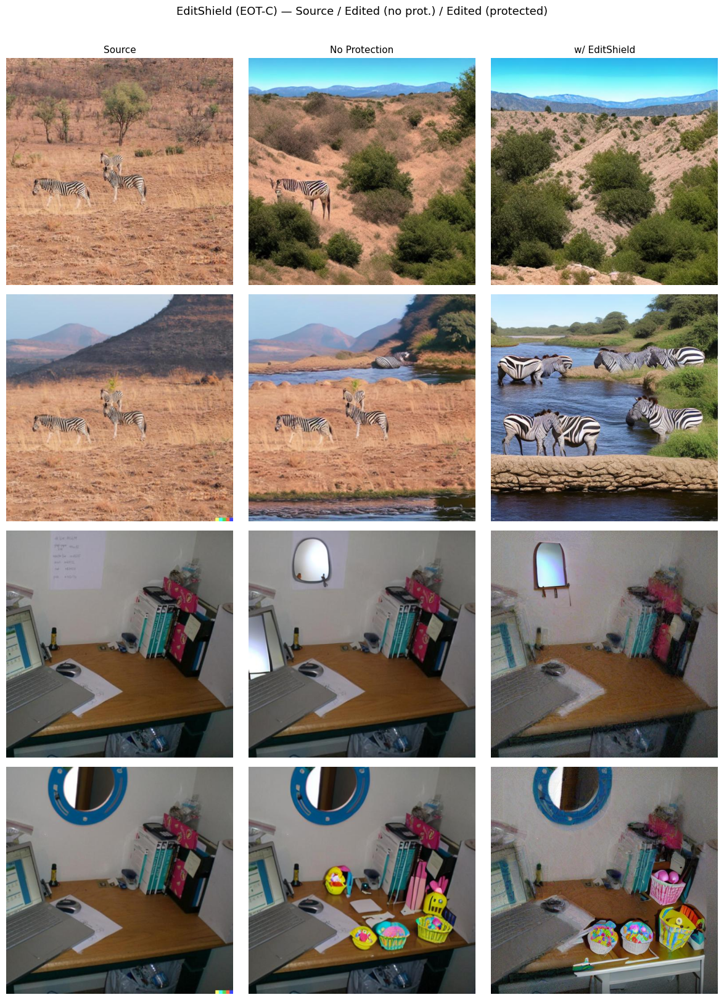

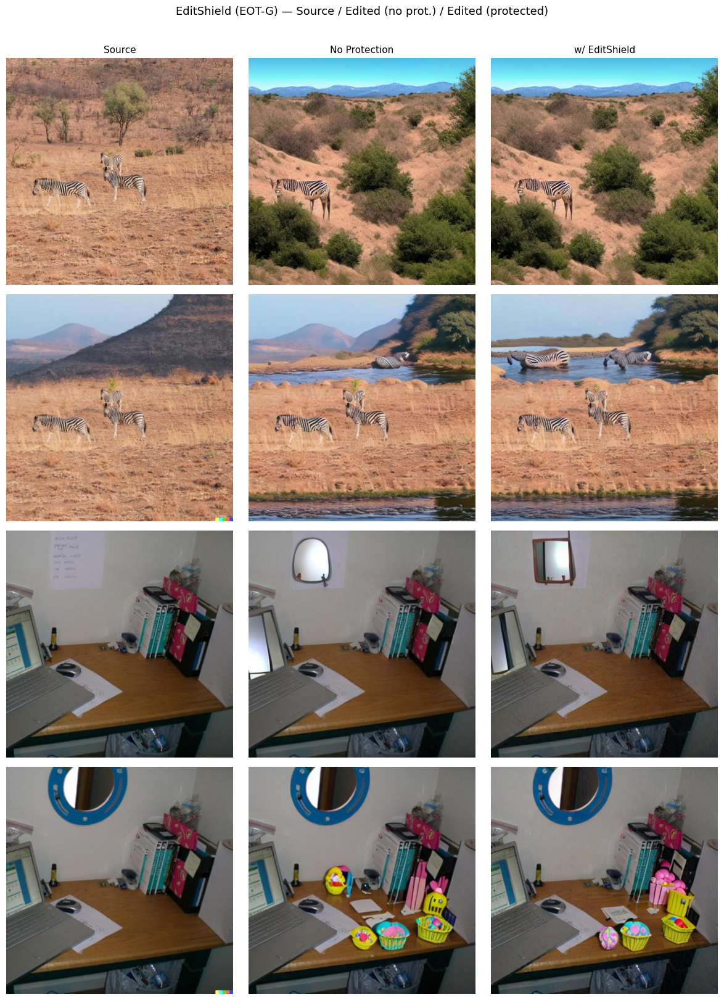

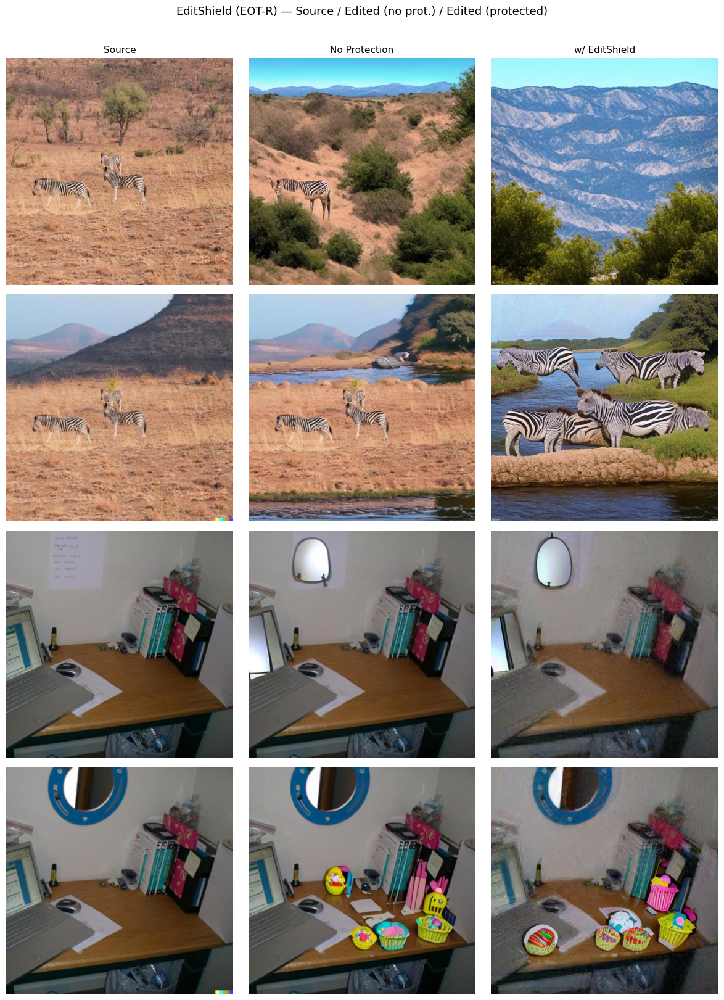

In [23]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

def visualize_protection(eot_tag: str, n_samples: int = 4):
    base = os.path.join(OUT_DIR, eot_tag)
    sample_ids = sorted(os.listdir(os.path.join(base, 'Ori')))[:n_samples]

    fig, axes = plt.subplots(n_samples, 3, figsize=(12, 4 * n_samples))
    fig.suptitle(f'EditShield ({eot_tag}) — Source / Edited (no prot.) / Edited (protected)',
                 fontsize=13, y=1.01)

    for row, sid in enumerate(sample_ids):
        fnames = sorted(os.listdir(os.path.join(base, 'Ori', sid)))
        if not fnames:
            continue
        fn = fnames[0]

        ori    = Image.open(os.path.join(base, 'Ori_50',    sid, fn))
        gen    = Image.open(os.path.join(base, 'Gen_50',    sid, fn))
        advgen = Image.open(os.path.join(base, 'AdvGen_50', sid, fn))

        for col, (img, title) in enumerate([(ori, 'Source'), (gen, 'No Protection'), (advgen, 'w/ EditShield')]):
            ax = axes[row, col] if n_samples > 1 else axes[col]
            ax.imshow(img)
            ax.axis('off')
            if row == 0:
                ax.set_title(title, fontsize=11)

    plt.tight_layout()
    plt.savefig(os.path.join(OUT_DIR, f'{eot_tag}_visual.png'), bbox_inches='tight', dpi=150)
    plt.show()

visualize_protection('EOT-C')
visualize_protection('EOT-G')
visualize_protection('EOT-R')

---
## 8. Quantitative Results

Aggregates CLIP image similarity for all three EOT variants.
Lower = worse editing = better protection (matches paper Fig. 5).

Method  CLIP sim (no prot.) ↓  CLIP sim (w/ prot.) ↓     Drop
 EOT-C               0.844898               0.736665 0.108234
 EOT-G               0.844898               0.828387 0.016511
 EOT-R               0.844898               0.723694 0.121205


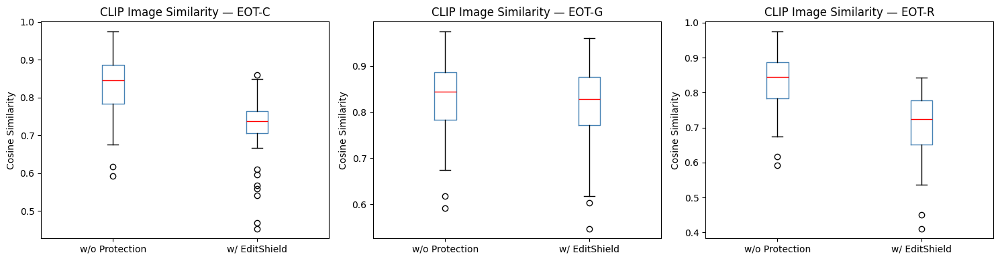

In [24]:
import seaborn as sns

results = {}
for tag in ('EOT-C', 'EOT-G', 'EOT-R'):
    csv_path = os.path.join(OUT_DIR, tag, 'EXCEL_50', 'result.csv')
    if os.path.exists(csv_path):
        results[tag] = pd.read_csv(csv_path)

if results:
    # Summary table
    rows = []
    for tag, df in results.items():
        rows.append({
            'Method': tag,
            'CLIP sim (no prot.) ↓': df['clip_sim_no_protection'].median(),
            'CLIP sim (w/ prot.) ↓': df['clip_sim_with_protection'].median(),
            'Drop': df['clip_sim_no_protection'].median() - df['clip_sim_with_protection'].median(),
        })
    print(pd.DataFrame(rows).to_string(index=False))

    # Box plot (matches paper Fig. 5 style)
    fig, axes = plt.subplots(1, len(results), figsize=(5 * len(results), 4))
    if len(results) == 1:
        axes = [axes]

    for ax, (tag, df) in zip(axes, results.items()):
        plot_data = pd.DataFrame({
            'w/o Protection': df['clip_sim_no_protection'],
            'w/ EditShield':  df['clip_sim_with_protection'],
        })
        plot_data.plot.box(ax=ax, color={'boxes': 'steelblue', 'whiskers': 'black',
                                         'medians': 'red', 'caps': 'black'})
        ax.set_title(f'CLIP Image Similarity — {tag}')
        ax.set_ylabel('Cosine Similarity')

    plt.tight_layout()
    plt.savefig(os.path.join(OUT_DIR, 'clip_similarity_boxplot.png'), dpi=150)
    plt.show()
else:
    print("No results yet — run Section 6 first.")

---
## 9. CLIP Text-Image Direction Similarity

Requires image captions. The paper uses LLaVA-1.5-13B, which needs ~26 GB VRAM
(A100 only). This cell uses a lighter captioning approach (`blip-2`) as a proxy
that runs on T4 and gives comparable directional similarity numbers.

**For exact paper reproduction:** switch to LLaVA-1.5-13B on an A100 instance.

In [21]:
# ── Install BLIP-2 captioning (T4-compatible proxy) ───────────────────────────
# !pip install -q transformers>=4.36 Pillow

from transformers import Blip2Processor, Blip2ForConditionalGeneration

BLIP_CACHE = f'{MODEL_DIR}/blip2'
print("Loading BLIP-2 captioner (~5 GB)...")
blip_processor = Blip2Processor.from_pretrained(
    'Salesforce/blip2-opt-2.7b', cache_dir=BLIP_CACHE)
blip_model = Blip2ForConditionalGeneration.from_pretrained(
    'Salesforce/blip2-opt-2.7b', cache_dir=BLIP_CACHE,
    torch_dtype=torch.float16).to(DEVICE)
blip_model.eval()
print("BLIP-2 ready.")

def caption(image_path: str) -> str:
    img = Image.open(image_path).convert('RGB')
    inputs = blip_processor(images=img, return_tensors='pt').to(DEVICE, dtype=torch.float16)
    with torch.no_grad():
        ids = blip_model.generate(**inputs, max_new_tokens=50)
    return blip_processor.decode(ids[0], skip_special_tokens=True).strip()

Loading BLIP-2 captioner (~5 GB)...


The image processor of type `BlipImageProcessor` is now loaded as a fast processor by default, even if the model checkpoint was saved with a slow processor. This is a breaking change and may produce slightly different outputs. To continue using the slow processor, instantiate this class with `use_fast=False`. 


Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/1247 [00:00<?, ?it/s]

BLIP-2 ready.


In [26]:
# ── Compute direction similarity for EOT-C ────────────────────────────────────

EOT_EVAL = 'EOT-C'
base = os.path.join(OUT_DIR, EOT_EVAL)
sample_ids = sorted(os.listdir(os.path.join(base, 'Ori_50')))
if QUICK_TEST:
    sample_ids = sample_ids[:20]

dir_sim_records = []

for sid in tqdm(sample_ids, desc='Direction similarity'):
    fnames = sorted(os.listdir(os.path.join(base, 'Ori_50', sid)))
    if not fnames:
        continue
    fn = fnames[0]

    p_ori    = os.path.join(base, 'Ori_50',    sid, fn)
    p_gen    = os.path.join(base, 'Gen_50',    sid, fn)
    p_advgen = os.path.join(base, 'AdvGen_50', sid, fn)

    cap_src    = caption(p_ori)
    cap_gen    = caption(p_gen)
    cap_advgen = caption(p_advgen)

    with open(os.path.join(DATA_DIR, sid, 'prompt.json')) as f:
        instruction = json.load(f)['edit']

    def to_t(path):
        arr = np.array(Image.open(path).resize((512, 512))) / 255.
        return torch.tensor(arr.transpose(2,0,1)).float().unsqueeze(0).to(DEVICE)

    f_src    = clip_model.encode_image(to_t(p_ori))
    f_gen    = clip_model.encode_image(to_t(p_gen))
    f_advgen = clip_model.encode_image(to_t(p_advgen))

    t_src    = clip_model.encode_text([cap_src])
    t_gen    = clip_model.encode_text([cap_gen])
    t_advgen = clip_model.encode_text([cap_advgen])

    # Direction similarity: how well image change agrees with instruction
    dir_bef = F.cosine_similarity(f_gen    - f_src, t_gen    - t_src).item()
    dir_aft = F.cosine_similarity(f_advgen - f_src, t_advgen - t_src).item()

    dir_sim_records.append({
        'sample': sid, 'file': fn,
        'direction_sim_no_prot': dir_bef,
        'direction_sim_w_prot':  dir_aft,
        'cap_src': cap_src, 'cap_gen': cap_gen, 'cap_advgen': cap_advgen,
    })

df_dir = pd.DataFrame(dir_sim_records)
df_dir.to_csv(os.path.join(base, 'EXCEL_50', 'result_direction_sim.csv'), index=False)
print(f"\nDirection similarity (median):")
print(f"  No protection  : {df_dir['direction_sim_no_prot'].median():.4f}")
print(f"  w/ EditShield  : {df_dir['direction_sim_w_prot'].median():.4f}")
print(f"  Drop           : {(df_dir['direction_sim_no_prot'] - df_dir['direction_sim_w_prot']).median():.4f}")

Direction similarity:   0%|          | 0/20 [00:00<?, ?it/s]


Direction similarity (median):
  No protection  : 0.0839
  w/ EditShield  : 0.0872
  Drop           : -0.0289


---
## 10. Download All Results

Zips outputs from Drive and downloads to your machine.

In [29]:
import shutil

zip_path = '/content/drive/MyDrive/EditShield/editshield_results_50'
shutil.make_archive(zip_path, 'zip', OUT_DIR)
print("Saved to:", zip_path + '.zip')


Saved to: /content/drive/MyDrive/EditShield/editshield_results_50.zip


---
## Troubleshooting

| Symptom | Fix |
|---|---|
| `ImportError: cannot import name 'cached_download'` | Re-run Section 1 (install cell now uses `diffusers>=0.30`), then **restart the runtime**. |
| `CUDA out of memory` | Restart runtime, re-run from Section 5. On T4: reduce `INFER_STEPS` to 50. |
| `RuntimeError: local_files_only=True` | Delete the `IP2P_CACHE` folder from Drive and re-run Section 2. |
| Session disconnected mid-run | All images saved to Drive per-sample — re-run skips already-saved samples if you add an `os.path.exists()` check. |
| BLIP-2 OOM on T4 | `torch.float16` already set; also try reducing image size to 384. |
| `No module named 'clip'` | Re-run Section 1, then restart runtime. |